<a href="https://colab.research.google.com/github/Subbar26/Proyecto_ia/blob/main/Copia_de_Proyecto3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Proyecto de IA I


##Integrantes
- Miguel Fernando Pimiento Escobar
- Jesus Ramirez

**URL dataset:** https://www.kaggle.com/datasets/gpiosenka/100-bird-species


- *Conjunto de datos de 525 especies de aves. 84635 imágenes de entrenamiento, 2625 imágenes de prueba (5 imágenes por especie) y 2625 imágenes de validación (5 imágenes por especie). Este es un conjunto de datos de muy alta calidad donde solo hay un ave en cada imagen y el ave normalmente ocupa al menos el 50% de los píxeles de la imagen. Como resultado, incluso un modelo moderadamente complejo logrará precisiones de entrenamiento y prueba en el rango medio del 90%. Nota: todas las imágenes son originales y no se crean mediante aumento.*

- *Algo curioso con respecto al dataset, es que las imágenes para entrenar hay de cierto modo una deficiencia en la proporción de imágenes de especies masculinas con respecto a imágenes de especies femeninas. Ya que alrededor del 80% de las imágenes son de machos y el 20% de hembras.Además, los machos típicos tienen colores mucho más diversos, mientras que las hembras de una especie suelen ser suaves.*

#Importando librerias.

> Importamos las librerías necesarias para el desarrollo incial de nuestro proyecto.



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import sys
from sklearn.preprocessing import LabelEncoder

import time

from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import *

#Cargando el dataset de drive.

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd "/content/gdrive/MyDrive/proyecto_IA/data_set"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/MyDrive/proyecto_IA/data_set


#Leyendo el dataset y renombrando las columnas.
- *Podemos observar que el csv que se nos proporciona contiene cinco columnas, las cuáles renombramos y mostramos a continuación:*

In [ ]:
dataset = pd.read_csv("birds.csv")
dataset = dataset.rename(columns={"class id": "Especie Id", "filepaths":"Direccion imagen", "labels": "Especie", "scientific name": "Nombre cientifico", "data set" : "Tipo dato"})
print("Cantidad de imagenes del dataset:", dataset.shape[0])
dataset.head(10)

Cantidad de imagenes del dataset: 89885


,Especie Id,Direccion imagen,Especie,Tipo dato,Nombre cientifico
0,0.0,train/ABBOTTS BABBLER/001.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
1,0.0,train/ABBOTTS BABBLER/007.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
2,0.0,train/ABBOTTS BABBLER/008.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
3,0.0,train/ABBOTTS BABBLER/009.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
4,0.0,train/ABBOTTS BABBLER/002.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
5,0.0,train/ABBOTTS BABBLER/003.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
6,0.0,train/ABBOTTS BABBLER/004.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
7,0.0,train/ABBOTTS BABBLER/005.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
8,0.0,train/ABBOTTS BABBLER/006.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
9,0.0,train/ABBOTTS BABBLER/010.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI


# Filtrando de el dataset original (no se cargaban todas las imágenes en su totalidad)

*Este proceso de filtrado se realizó debido a que algunas imágenes no se estaban cargando; presentaban un tamaño diferente al original.*

- El siguiente codigo guarda el shape de la primera imagen
- Compara con el shape de cada imagen y arroja una advertencia, en caso de no coincidir la imagén se considera como inconsistente.
- Así mismo, crea la imágen promedio, con el promedio de todas las imágenes y la guarda.




In [ ]:
# Muestra una barra de progreso para indicar el progreso de una iteración.
def barra_progreso(iteracion, total, direccion, longitud = 100):
  cargando = ['/', '-', '\\', '|']
  porcentaje = iteracion/total
  carga = int(porcentaje*longitud)
  no_cargado = longitud-carga
  cadena = '█'*carga + '-'*no_cargado
  sys.stdout.write(f"\r\033[30m{cadena} {int(porcentaje * 100)}% {cargando[iteracion%4]} - Imagen: {direccion}\033[0m")
  sys.stdout.flush()


#  Verifica la forma de las imágenes en el dataset y encuentra inconsistencias.
#  Primero se verifica el shape de la imagen 1, luego de se compara con el de las demás, en caso
#  de no coincidir se considera una inconsistencia
def verificar_shape():
  Shape = 0
  iteracion = 1
  suma = None
  for direccion_archivo in dataset['Direccion imagen']:
    try:
      imagen = cv2.cvtColor(cv2.imread(direccion_archivo), cv2.COLOR_BGR2RGB)
      if not Shape:
        Shape = imagen.shape
        sum = np.zeros(Shape, dtype=np.float64)
        print("Empezando verificancion de Shape: ", Shape)
      if not (Shape == imagen.shape):
        inconsistencias.append(direccion_archivo)
      else:
        sum += imagen.astype(np.float64)
      del imagen
    except Exception as e:
      inconsistencias.append(direccion_archivo)
    finally:
      barra_progreso(iteracion, dataset.shape[0], direccion_archivo, longitud = 50)
      iteracion += 1
  total_imagenes = dataset.shape[0]-len(inconsistencias)
  # Sacando el promedio de las imagenes
  promedio_imagen = (sum / total_imagenes).astype(np.uint8)
  cv2.imwrite('promedio_imagen.png', cv2.cvtColor(np.uint8(promedio_imagen), cv2.COLOR_RGB2BGR))
  return "\nVerificacion finalizada, archivos inconsistentes identificados"


# # Lista para almacenar las direcciones de las imágenes inconsistentes
inconsistencias = []
print(verificar_shape())
inconsistencias = np.array(inconsistencias)

Empezando verificancion de Shape:  (224, 224, 3)
██████████████████████████████████████████████████ 100% - - Imagen: valid/BLACK BREASTED PUFFBIRD/5.jpg
Verificacion finalizada, archivos inconsistentes identificados


# Eliminando del dataset las imagenes que son incosistentes.
- Se eliminan las imagenes inconsistentes del dataset original, verificamos la cantidad de imagenes en cada caso.

In [ ]:
# Verifica la cantidad de inconsistencias
# son las direcciones de las imagenes que se consideran inconsistentes
print("Cantidad de inconsistenias:", inconsistencias.shape[0])
# Verifica la cantidad de imagenes antes de la eliminación
print("Cantidad de imagenes antes:", dataset.shape[0])
# Filtra el conjunto de datos para eliminar las imágenes que se consideraron inconsistentes
dataset = dataset[~dataset['Direccion imagen'].isin(inconsistencias)]
# Se muestra el nuevo total de imagenes
print("Cantidad de imagenes ahora:", dataset.shape[0])

#Guardando el dataset actualizado en el drive.
*esto se realiza para no tener que volver a verificar el shape de las imagenes*

In [ ]:
# guarda el DataFrame dataset en un archivo CSV llamado 'birds_update.csv'
# que contiene el dataset filtrado sin las imagenes inconsistentes

dataset.to_csv('birds_update.csv', index=False)

# Obteniendo las 10 especies con mas imagenes en el dataset actualizado.
*Como equipo de trabajo entendiendo el alcance que nos provee el coolaboratory, decidimos trabajar solo con 10 de las 525 especies en el dataset oriniginal; por lo cual, nos enfocamos en las 10 especies con mayor cantidad de imagenes o individuos.*

In [ ]:
dataset = pd.read_csv('birds_update.csv')

dataset_copia = dataset.copy()
dataset_copia['Especie Id'] = dataset_copia['Especie Id'].astype('int32')

# Contar el número de ocurrencias de cada especie en la columna 'Especie'
conteo = dataset["Especie"].value_counts()

# Convertir el resultado en un DataFrame y resetear el índice para obtener 'Especie' como una columna
conteo = pd.DataFrame(conteo)
conteo.reset_index(inplace=True)
conteo = conteo.rename(columns={"count": "Cantidad", "Cantidad" : "Especie"})

# Obtener las 10 primeras especies más comunes
primeras_filas = conteo.head(10)['Especie']

primeras_filas_df = pd.DataFrame(primeras_filas)
primeras_filas_df.reset_index(inplace=True)
primeras_filas_df = primeras_filas_df.drop(['index'], axis=1)
primeras_filas_df_sorted = primeras_filas_df.sort_values(by='Especie').reset_index(drop=True)

# Filtrar el conjunto de datos para incluir solo las filas correspondientes a las 10 primeras especies
data_10_images = dataset_copia[dataset_copia['Especie'].isin(primeras_filas)]
print("Cantidad total de imagenes:", data_10_images.shape[0])
display(conteo.head(10))
display(primeras_filas_df_sorted)

# Crear una instancia de LabelEncoder
label_encoder = LabelEncoder()
data_10_images_copy = data_10_images.copy()

# Codificar la variable categórica 'Especie' en el conjunto de datos data_10_images
especie_codificada = label_encoder.fit_transform(data_10_images['Especie'])

# Crear una nueva columna 'Especie_codificada' en data_10_images y asignarle los valores codificados
data_10_images_copy.loc[:,'Especie_codificada'] = especie_codificada
data_10_images_copy = data_10_images_copy.drop(['Especie', 'Especie Id'], axis=1)
# Mostrar las primeras filas del conjunto de datos con la variable categórica codificada
display(data_10_images_copy.head(10))



Cantidad total de imagenes: 2363


,Especie,Cantidad
0,RUFOUS TREPE,273
1,HOUSE FINCH,258
2,D-ARNAUDS BARBET,243
3,OVENBIRD,243
4,ASIAN GREEN BEE EATER,230
5,SWINHOES PHEASANT,226
6,WOOD DUCK,224
7,CASPIAN TERN,223
8,RED BILLED TROPICBIRD,222
9,WOOD THRUSH,221


,Especie
0,ASIAN GREEN BEE EATER
1,CASPIAN TERN
2,D-ARNAUDS BARBET
3,HOUSE FINCH
4,OVENBIRD
5,RED BILLED TROPICBIRD
6,RUFOUS TREPE
7,SWINHOES PHEASANT
8,WOOD DUCK
9,WOOD THRUSH


,Direccion imagen,Tipo dato,Nombre cientifico,Especie_codificada
6255,train/ASIAN GREEN BEE EATER/162.jpg,train,MEROPS ORIENTALIS,0
6256,train/ASIAN GREEN BEE EATER/136.jpg,train,MEROPS ORIENTALIS,0
6257,train/ASIAN GREEN BEE EATER/153.jpg,train,MEROPS ORIENTALIS,0
6258,train/ASIAN GREEN BEE EATER/102.jpg,train,MEROPS ORIENTALIS,0
6259,train/ASIAN GREEN BEE EATER/145.jpg,train,MEROPS ORIENTALIS,0
6260,train/ASIAN GREEN BEE EATER/101.jpg,train,MEROPS ORIENTALIS,0
6261,train/ASIAN GREEN BEE EATER/105.jpg,train,MEROPS ORIENTALIS,0
6262,train/ASIAN GREEN BEE EATER/166.jpg,train,MEROPS ORIENTALIS,0
6263,train/ASIAN GREEN BEE EATER/106.jpg,train,MEROPS ORIENTALIS,0
6264,train/ASIAN GREEN BEE EATER/103.jpg,train,MEROPS ORIENTALIS,0


In [ ]:
#Guardando la copia del dataset codificado de las 10 especies
data_10_images_copy.to_csv('birds_update_codified.csv', index=False)

# Imagen aleatoria de cada una de las 10 especies con mas individuos.


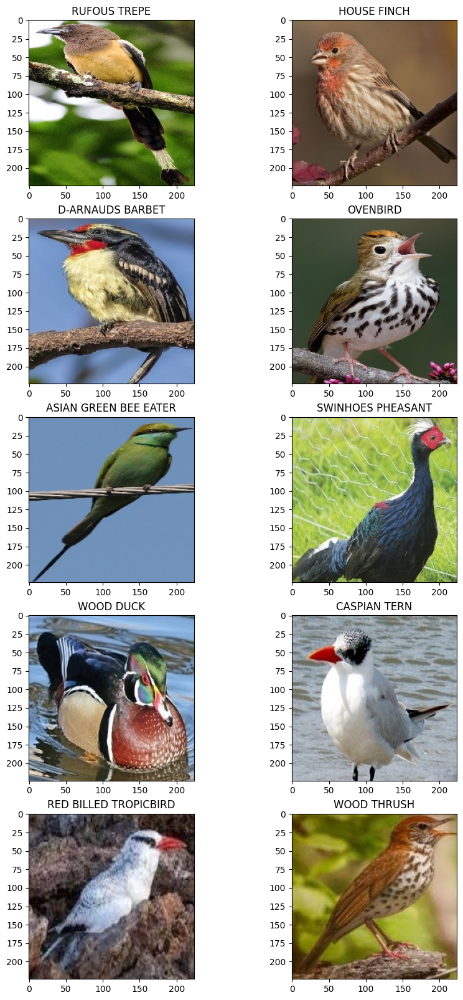

In [ ]:
images10 = pd.DataFrame(columns=['Direccion imagen', 'Especie'])
plt.figure(figsize=(10,20))
for i in range(10):
  # Filtra el DataFrame data_10_images para seleccionar todas las filas que corresponden a la especie actual en la iteración del bucle.
  select = data_10_images[data_10_images.Especie == primeras_filas[i]]
  # Selecciona una imagen al azar
  select = select.sample()[['Direccion imagen', 'Especie']]
  # Concatena las filas seleccionadas al DataFrame images10, ignorando el índice original y creando uno nuevo.
  images10 = pd.concat([images10, select], ignore_index=True)
  # Lee la imagen correspondiente
  imagen = cv2.cvtColor(cv2.imread(images10.loc[i,'Direccion imagen']), cv2.COLOR_BGR2RGB)
  plt.subplot(5,2,i+1)
  plt.title(images10.loc[i,'Especie'])
  plt.imshow(imagen)
plt.show()

#Histograma de las 10 imagenes anteriores

*Los histogramas generados representan la distribución de intensidades de píxeles en cada una de las imágenes en escala de grises.*

- En el eje horizontal se representan los niveles de grises desde el 0 hasta el 255.
- El eje vertical representa la cantidad de píxeles para cada nivel de gris.

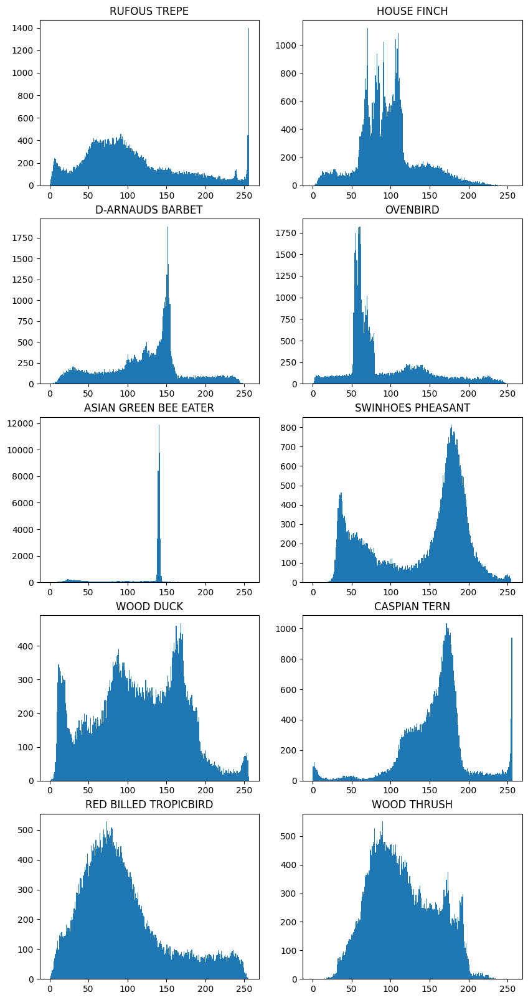

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  plt.subplot(5,2,i+1)
  # Lee la imagen correspondiente a la iteración actual del bucle  y la convierte a escala de grises usando cv2.COLOR_BGR2GRAY.
  imagen = cv2.cvtColor(cv2.imread(images10.loc[i,'Direccion imagen']), cv2.COLOR_BGR2GRAY)
  plt.title(images10.loc[i,'Especie'])
  # imagen.flatten() se utiliza para aplanar la matriz de píxeles de la imagen en un arreglo unidimensional antes de pasarla al histograma(vectorizar)
  plt.hist(imagen.flatten(), bins=256, range=(0,256))
  del imagen
plt.show()

#Histograma en cada canal de las 10 anteriores (Imagen aleatoria de cada una de las 10 especies con mas individuos)
*Los histogramas generados muestran la distribución de intensidades de los diferentes canales de color (rojo, verde y azul) en las imágenes seleccionadas.*

- Esto es útil para el análisis y procesamiento de imágenes.

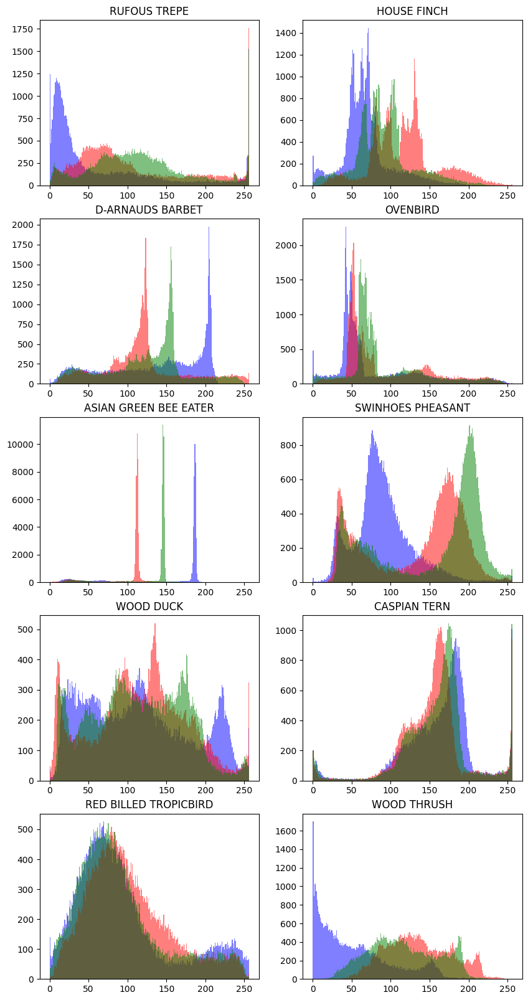

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  plt.subplot(5,2,i+1)
  imagen = cv2.cvtColor(cv2.imread(images10.loc[i,'Direccion imagen']), cv2.COLOR_BGR2RGB)
  plt.title(images10.loc[i,'Especie'])
  # Genera tres histogramas superpuestos en el subplot actual, uno para cada canal de color (rojo, verde y azul).
  plt.hist(imagen[:,:,2].flatten(), bins=256, color='blue', alpha=0.5, range=(0,256))
  plt.hist(imagen[:,:,0].flatten(), bins=256, color='red', alpha=0.5, range=(0,256))
  plt.hist(imagen[:,:,1].flatten(), bins=256, color='green', alpha=0.5, range=(0,256))
  del imagen
plt.show()

#Funcion de ecualizacion del histograma RGB y GRAY ademas de umbralizacion

In [ ]:
def ecualizacion_RGB(imagen):
  #calculo de la frecuencia en cada intensidad de pixel por canal
  nkr, limites = np.histogram(imagen[:,:,0].ravel(), bins=256, range=(0,256))
  nkg, limites = np.histogram(imagen[:,:,1].ravel(), bins=256, range=(0,256))
  nkb, limites = np.histogram(imagen[:,:,2].ravel(), bins=256, range=(0,256))

  #probabilidad de que aparezca cada intensisdad de pixel para cada canal
  pkr= nkr/(imagen.shape[0]*imagen.shape[1])
  pkg= nkg/(imagen.shape[0]*imagen.shape[1])
  pkb= nkb/(imagen.shape[0]*imagen.shape[1])

  #tranformacion de cada pixel para cada canal
  skr= np.zeros(pkr.shape)
  skg= np.zeros(pkg.shape)
  skb= np.zeros(pkb.shape)
  sumr,sumg,sumb = 0,0,0
  for k in range(256):
    sumr += pkr[k]
    sumg += pkg[k]
    sumb += pkb[k]
    skr[k] = 255*sumr
    skg[k] = 255*sumg
    skb[k] = 255*sumb
  skr = skr.astype(np.uint8)
  skg = skg.astype(np.uint8)
  skb = skb.astype(np.uint8)

  #aplicando la tranformacion a la imagen
  new_imagen = np.zeros(imagen.shape).astype(np.uint8)
  for fila in range(imagen.shape[0]):
    for columna in range(imagen.shape[1]):
      new_imagen[fila, columna, 0] = skr[imagen[fila, columna, 0]]
      new_imagen[fila, columna, 1] = skg[imagen[fila, columna, 1]]
      new_imagen[fila, columna, 2] = skb[imagen[fila, columna, 2]]


  return new_imagen

def ecualizacion_GRAY(imagen):
  #calculo de la frecuencia en cada intensidad de pixel
  nk, limites = np.histogram(imagen.ravel(), bins=256, range=(0,256))

  #probabilidad de que aparesca cada intensisdad de pixel
  pk= nk/(imagen.shape[0]*imagen.shape[1])

  #tranformacion de cada pixel
  sk = np.zeros(pk.shape)
  sum = 0
  for k in range(256):
    sum += pk[k]
    sk[k] = 255*sum
  sk = sk.astype(np.uint8)

  #aplicando la tranformacion a la imagen
  new_imagen = np.zeros(imagen.shape).astype(np.uint8)
  for fila in range(imagen.shape[0]):
    for columna in range(imagen.shape[1]):
      new_imagen[fila, columna] = sk[imagen[fila, columna]]


  return new_imagen

def umbralizacion_percentil(imagen, percentil):
  criterio = np.percentile(imagen.ravel(), percentil)
  new_imagen = np.where(imagen<criterio, 0, 255)
  return new_imagen

#Promedio de todas las imagenes en el dataset actualizado (birds_update.csv)
- *Promedio de todas las imagenes, representado de diferentes formas*

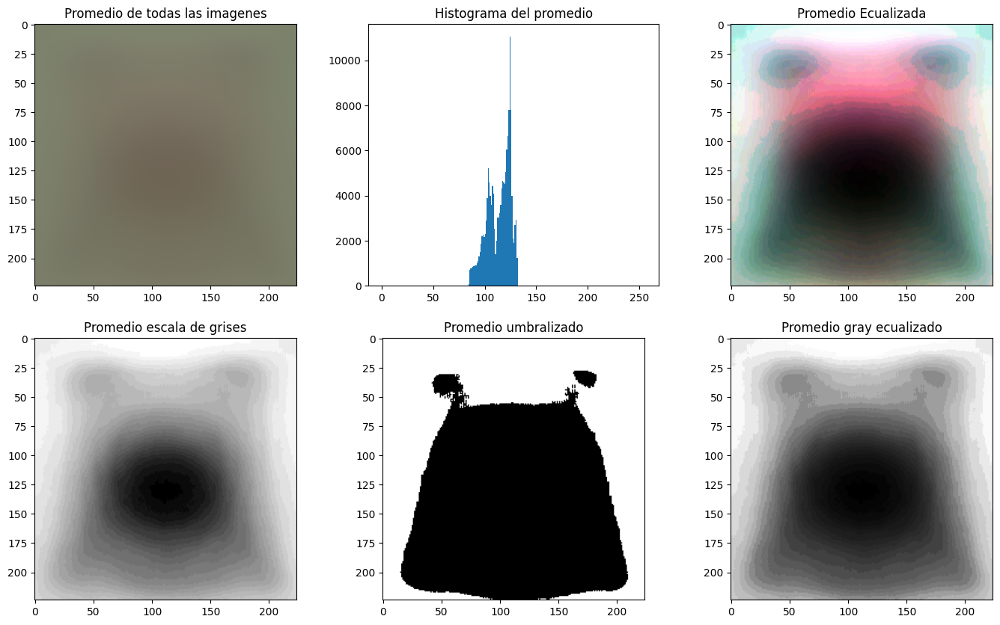

In [ ]:
# Cargamos la imagen que contiene el promedio de todas las imagenes en el dataset
# recordando que este se halló a la hora de verificar el shape de las imagenes

imagenProm = cv2.cvtColor(cv2.imread('promedio_imagen.png'), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(17,10))

plt.subplot(2,3,1)
plt.imshow(imagenProm)
plt.title('Promedio de todas las imagenes')

plt.subplot(2,3,2)
plt.hist(imagenProm.ravel(), bins=256, range=[0,256])
plt.title('Histograma del promedio')

imagenEcu = ecualizacion_RGB(imagenProm)

plt.subplot(2,3,3)
plt.imshow(imagenEcu)
plt.title('Promedio Ecualizada')

imagenGray = cv2.cvtColor(imagenProm, cv2.COLOR_RGB2GRAY)

plt.subplot(2,3,4)
plt.imshow(imagenGray, cmap='gray')
plt.title('Promedio escala de grises')

imagenGrayU = umbralizacion_percentil(imagenGray, 60)

plt.subplot(2,3,5)
plt.imshow(imagenGrayU, cmap='gray')
plt.title('Promedio umbralizado')

imagenGrayEcu = ecualizacion_GRAY(imagenGray)

plt.subplot(2,3,6)
plt.imshow(imagenGrayEcu, cmap='gray')
plt.title('Promedio gray ecualizado')

plt.show()
del imagenProm
del imagenEcu
del imagenGray
del imagenGrayU
del imagenGrayEcu

# Promedio de las imagenes de cada especie (10 especies con más individuos)

-  Las imágenes promedio proporcionan una representación visual de las características comunes de las especies de aves en el conjunto de datos.

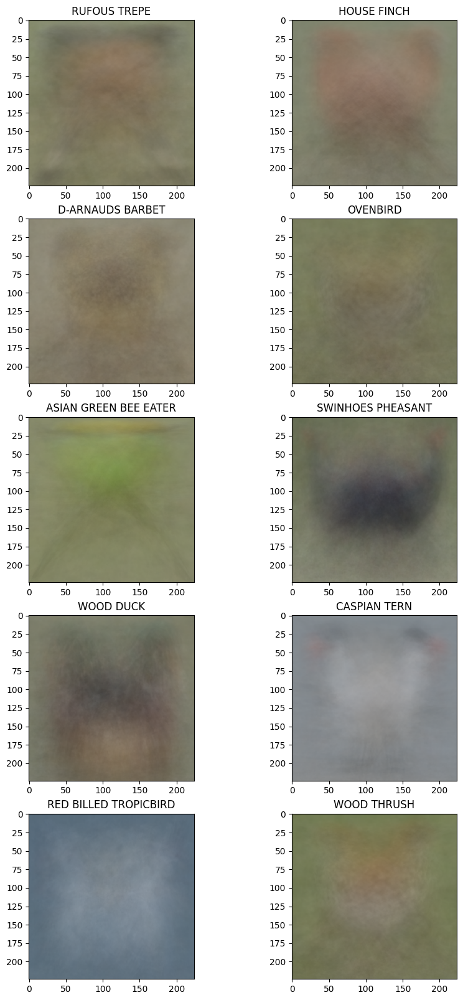

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  imagenes = []
  for dir in data_10_images[data_10_images.Especie == primeras_filas[i]]['Direccion imagen']:
    imagen = cv2.cvtColor(cv2.imread(dir), cv2.COLOR_BGR2RGB)
    imagenes.append(imagen)
    del imagen

  imagenes = np.array(imagenes)
  # Se calcula la imagen promedio de todas las imágenes de la especie actual
  # tomando la media a lo largo del eje 0 (es decir, entre todas las imágenes)
  promedio = np.mean(imagenes, axis=0).astype(np.uint8)

  plt.subplot(5,2,i+1)
  plt.imshow(promedio)
  plt.title(primeras_filas[i])

  del imagenes
  del promedio

plt.show()

#Promedios de las especies ecualizados

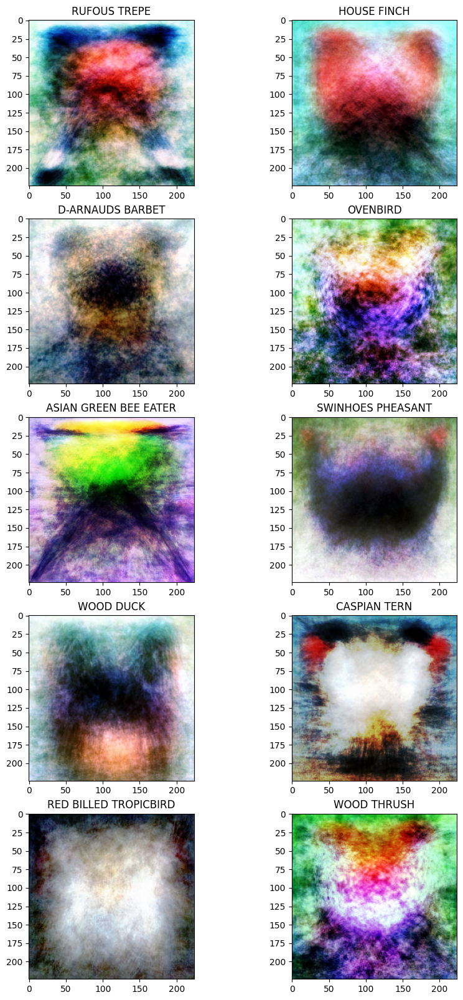

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  imagenes = []
  for dir in data_10_images[data_10_images.Especie == primeras_filas[i]]['Direccion imagen']:
    imagen = cv2.cvtColor(cv2.imread(dir), cv2.COLOR_BGR2RGB)
    imagenes.append(imagen)
    del imagen

  imagenes = np.array(imagenes)
  # Se calcula la imagen promedio de todas las imágenes de la especie actual
  # tomando la media a lo largo del eje 0 (es decir, entre todas las imágenes)
  promedio = np.mean(imagenes, axis=0).astype(np.uint8)

  promedio = ecualizacion_RGB(promedio)

  plt.subplot(5,2,i+1)
  plt.imshow(promedio)
  plt.title(primeras_filas[i])

  del imagenes
  del promedio

plt.show()

# visualizando patrones con umbralización

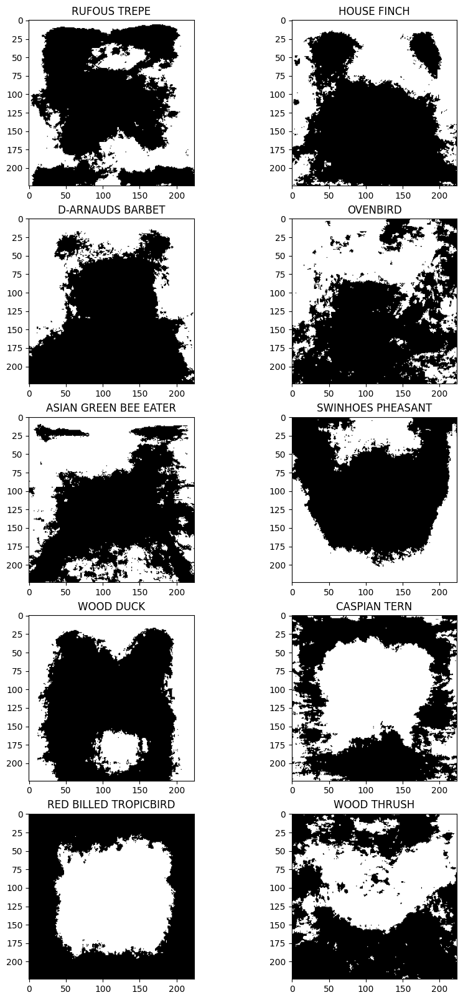

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  imagenes = []
  for dir in data_10_images[data_10_images.Especie == primeras_filas[i]]['Direccion imagen']:
    imagen = cv2.cvtColor(cv2.imread(dir), cv2.COLOR_BGR2RGB)
    imagenes.append(imagen)
    del imagen

  imagenes = np.array(imagenes)
  # Se calcula la imagen promedio de todas las imágenes de la especie actual
  # tomando la media a lo largo del eje 0 (es decir, entre todas las imágenes)
  promedio = np.mean(imagenes, axis=0).astype(np.uint8)

  promedio = cv2.cvtColor(promedio, cv2.COLOR_RGB2GRAY)
  promedio = umbralizacion_percentil(promedio, 60)

  plt.subplot(5,2,i+1)
  plt.imshow(promedio, cmap='gray')
  plt.title(primeras_filas[i])

  del imagenes
  del promedio

plt.show()

#Visualizando la superposición de 10 imagenes para la primera especie del conjunto de datos

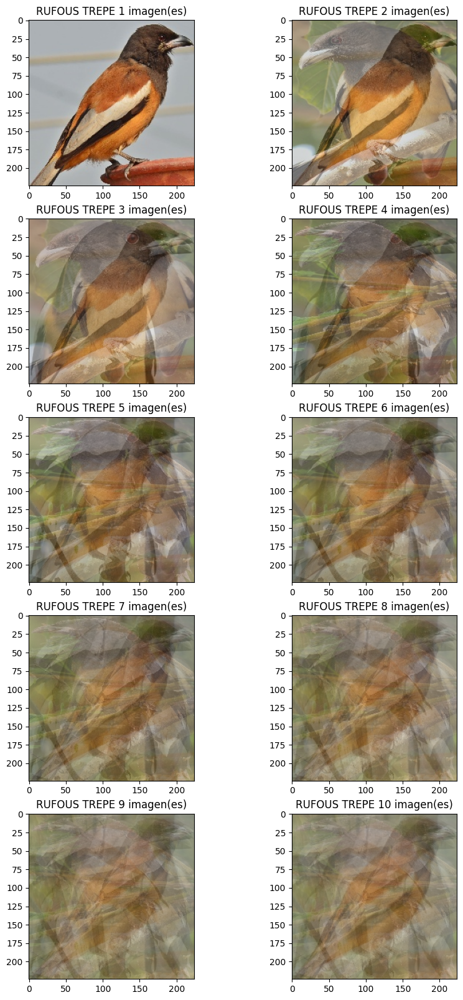

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  imagenes = []
  data = data_10_images[data_10_images.Especie == primeras_filas[0]]['Direccion imagen']
  data = data.reset_index(drop=True)
  for index in range(i+1):
    imagen = cv2.cvtColor(cv2.imread(data[index]), cv2.COLOR_BGR2RGB)
    imagenes.append(imagen)
    del imagen

  imagenes = np.array(imagenes)
  # Se calcula la imagen promedio de todas las imágenes de la especie actual
  # tomando la media a lo largo del eje 0 (es decir, entre todas las imágenes)
  promedio = np.mean(imagenes, axis=0).astype(np.uint8)

  plt.subplot(5,2,i+1)
  plt.imshow(promedio)
  plt.title(primeras_filas[0] + " " + str(i+1) + " imagen(es)")

  del imagenes
  del promedio

plt.show()

#Desviacion estandar del total de imagenes para las 10 especies seleccionadas.
- Estas representaciones gráficas de la desviación estandár nos proporciona información sobre la variabilidad y la consistencia de las características visuales entre las imágenes de las 10 especies representadas en el conjunto de datos, lo que puede ayudar a comprender mejor la diversidad y la morfología de estas especies.

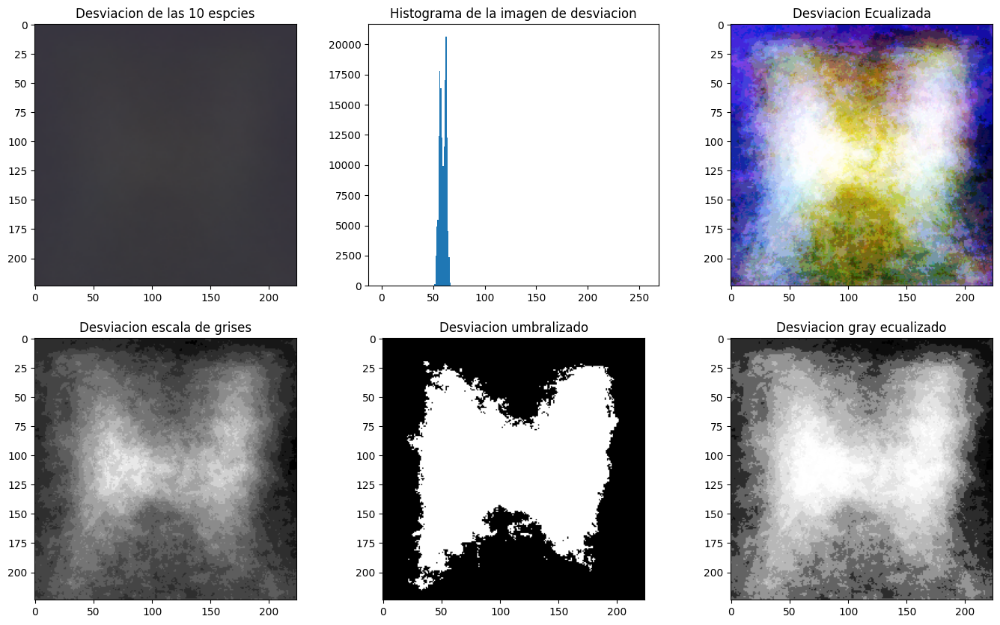

In [ ]:
imagenes = []
for dir in data_10_images['Direccion imagen']:
  imagen = cv2.cvtColor(cv2.imread(dir), cv2.COLOR_BGR2RGB)
  imagenes.append(imagen)
  del imagen

imagenes = np.array(imagenes)
# # Calcula la desviación estándar a lo largo del eje 0 (a través de las imágenes)
desviacion = np.std(imagenes, axis=0).astype(np.uint8)

plt.figure(figsize=(17,10))

plt.subplot(2,3,1)
plt.imshow(desviacion)
plt.title('Desviacion de las 10 espcies')

plt.subplot(2,3,2)
plt.hist(desviacion.ravel(), bins=256, range=(0,256))
plt.title('Histograma de la imagen de desviacion')

imagenEcu = ecualizacion_RGB(desviacion)

plt.subplot(2,3,3)
plt.imshow(imagenEcu)
plt.title('Desviacion Ecualizada')

imagenGray = cv2.cvtColor(desviacion, cv2.COLOR_RGB2GRAY)

plt.subplot(2,3,4)
plt.imshow(imagenGray, cmap='gray')
plt.title('Desviacion escala de grises')

imagenGrayU = umbralizacion_percentil(imagenGray, 60)

plt.subplot(2,3,5)
plt.imshow(imagenGrayU, cmap='gray')
plt.title('Desviacion umbralizado')

imagenGrayEcu = ecualizacion_GRAY(imagenGray)

plt.subplot(2,3,6)
plt.imshow(imagenGrayEcu, cmap='gray')
plt.title('Desviacion gray ecualizado')

plt.show()
del desviacion
del imagenEcu
del imagenGray
del imagenGrayU
del imagenGrayEcu


# Desviacion estándar de las imagenes de cada una de las 10 especies seleccionadas

- Estas gráficas proporcionan información sobre la variabilidad y la consistencia de las características visuales entre las imágenes de las especies representadas

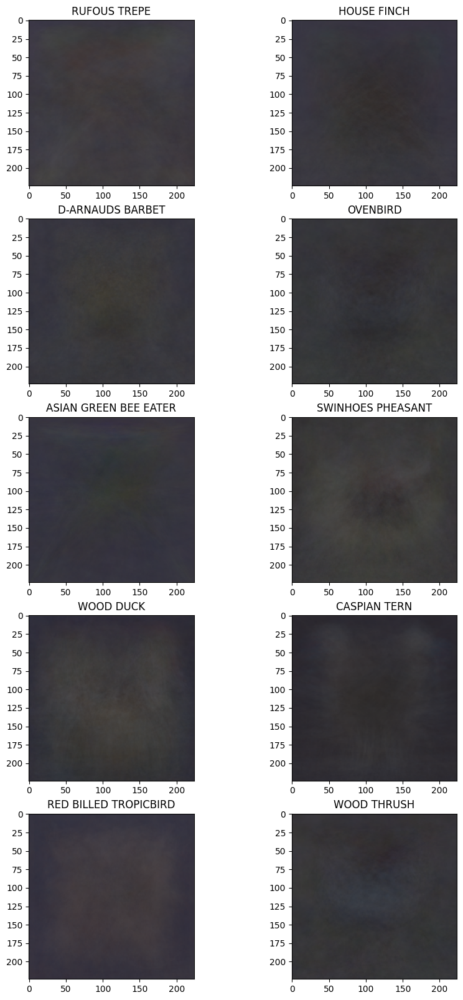

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  imagenes = []
  for dir in data_10_images[data_10_images.Especie == primeras_filas[i]]['Direccion imagen']:
    imagen = cv2.cvtColor(cv2.imread(dir), cv2.COLOR_BGR2RGB)
    imagenes.append(imagen)
    del imagen

  imagenes = np.array(imagenes)
  # Se calcula la desviación estándar para cada píxel a lo largo de todas las imágenes.
  desviacion = np.std(imagenes, axis=0).astype(np.uint8)

  plt.subplot(5,2,i+1)
  plt.imshow(desviacion)
  plt.title(primeras_filas[i])

  del imagenes
  del desviacion

plt.show()

# Desviaciones ecualizadas

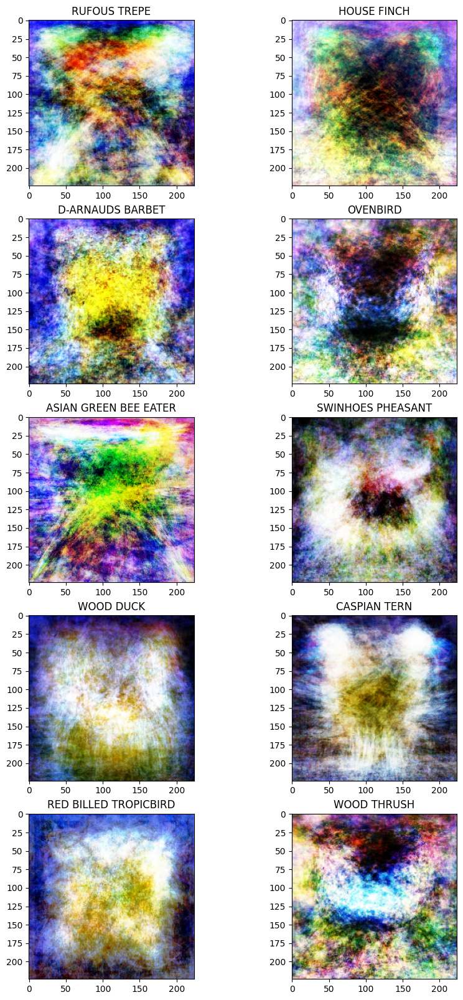

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  imagenes = []
  for dir in data_10_images[data_10_images.Especie == primeras_filas[i]]['Direccion imagen']:
    imagen = cv2.cvtColor(cv2.imread(dir), cv2.COLOR_BGR2RGB)
    imagenes.append(imagen)
    del imagen

  imagenes = np.array(imagenes)
  # Se calcula la desviación estándar para cada píxel a lo largo de todas las imágenes.
  desviacion = np.std(imagenes, axis=0).astype(np.uint8)

  desviacion = ecualizacion_RGB(desviacion)

  plt.subplot(5,2,i+1)
  plt.imshow(desviacion)
  plt.title(primeras_filas[i])

  del imagenes
  del desviacion

plt.show()

#Visualizando patrones con umbralizacion

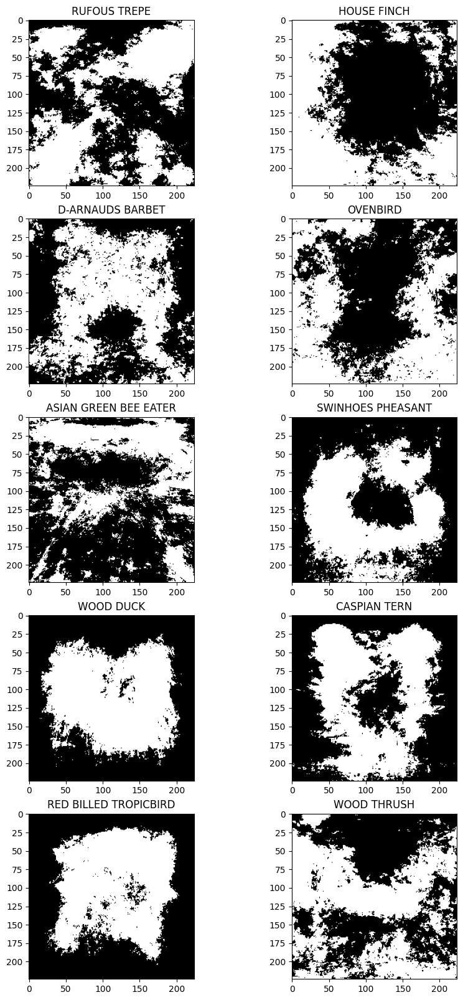

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  imagenes = []
  for dir in data_10_images[data_10_images.Especie == primeras_filas[i]]['Direccion imagen']:
    imagen = cv2.cvtColor(cv2.imread(dir), cv2.COLOR_BGR2RGB)
    imagenes.append(imagen)
    del imagen

  imagenes = np.array(imagenes)
  # Se calcula la desviación estándar para cada píxel a lo largo de todas las imágenes.
  desviacion = np.std(imagenes, axis=0).astype(np.uint8)

  desviacion = cv2.cvtColor(desviacion, cv2.COLOR_RGB2GRAY)

  desviacion = umbralizacion_percentil(desviacion, 60)

  plt.subplot(5,2,i+1)
  plt.imshow(desviacion, cmap='gray')
  plt.title(primeras_filas[i])

  del imagenes
  del desviacion

plt.show()

# Avance de cada unas de las especies (ecualizadas)

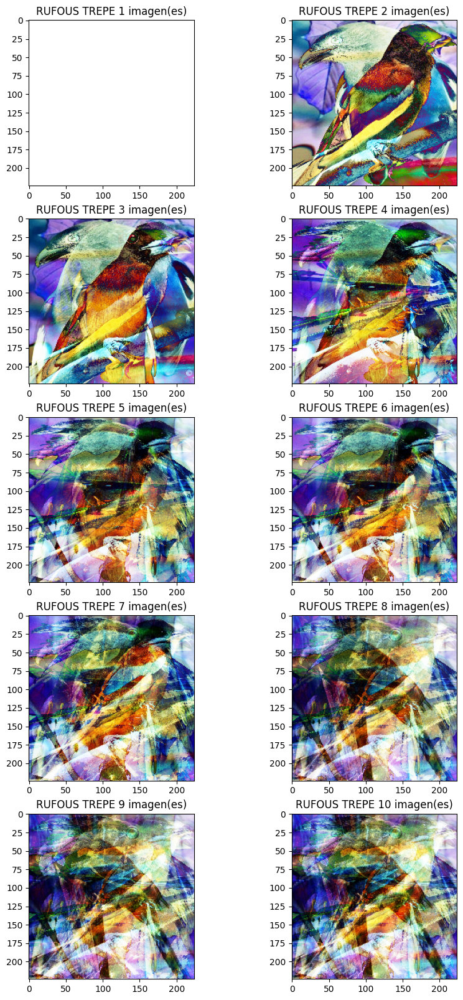

In [ ]:
plt.figure(figsize=(10,20))
for i in range(10):
  imagenes = []
  data = data_10_images[data_10_images.Especie == primeras_filas[0]]['Direccion imagen']
  data = data.reset_index(drop=True)
  for index in range(i+1):
    imagen = cv2.cvtColor(cv2.imread(data[index]), cv2.COLOR_BGR2RGB)
    imagenes.append(imagen)
    del imagen

  imagenes = np.array(imagenes)
  # Se calcula la imagen promedio de todas las imágenes de la especie actual
  # tomando la media a lo largo del eje 0 (es decir, entre todas las imágenes)
  desviacion = np.std(imagenes, axis=0).astype(np.uint8)

  desviacion = ecualizacion_RGB(desviacion)

  plt.subplot(5,2,i+1)
  plt.imshow(desviacion)
  plt.title(primeras_filas[0] + " " + str(i+1) + " imagen(es)")

  del imagenes
  del desviacion

plt.show()

##Gráfico de barras para las 10 especies con más individuos.
*El gráfico de barras muestra la distribución de las 10 especies con mayor cantidad de individuos asociados. Por lo que, cada barra representa una de las diez especies seleccionadas, mientras que la altura de la barra indica la cantidad de individuos observados para esa especie en particular.*

- El gráfico de barras proporciona una representación visual clara de la composición y abundancia relativa de las especies en el conjunto de datos, lo que nos ayuda a comprender mejor la biodiversidad y los posibles procesos ecológicos en juego.

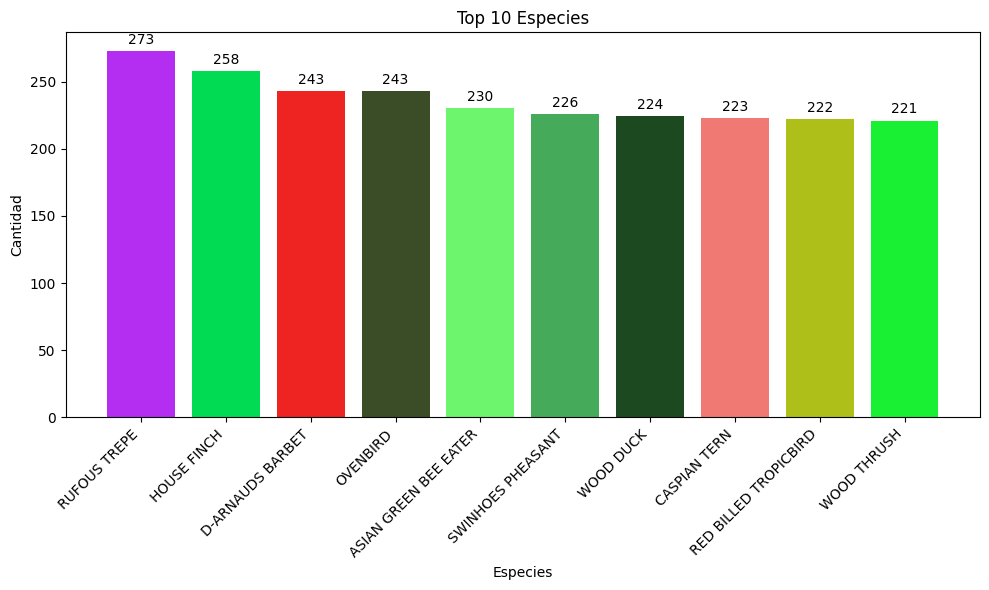

In [ ]:
count10 = conteo.head(10)

# Generar colores aleatorios
colores = np.random.rand(count10.shape[0], 3)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(10, 6))

# Graficar las barras
bars = ax.bar(count10['Especie'], count10['Cantidad'], color=colores)

# Añadir etiquetas y título
ax.set_title('Top 10 Especies')
ax.set_xlabel('Especies')
ax.set_ylabel('Cantidad')

# Rotar las etiquetas del eje x para mejorar la legibilidad
plt.xticks(rotation=45, ha='right')

# Añadir etiquetas a las barras
for bar in bars:
    height = bar.get_height()
    ax.annotate('{}'.format(height),
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom')

# Mostrar la gráfica
plt.tight_layout()
plt.show()

#Grafico de torta para las 10 especies con más individuos
*El gráfico de pastel presenta la distribución de las 10 especies con mayor cantidad de individuos asociados. Cada porción del pastel representa una especie diferente, donde el tamaño de cada porción refleja la proporción de individuos observados para esa especie en particular. Similar a repartir una tarta, las porciones más grandes indican una mayor abundancia de la especie correspondiente, mientras que las porciones más pequeñas representan especies menos comunes o menos abundantes.*

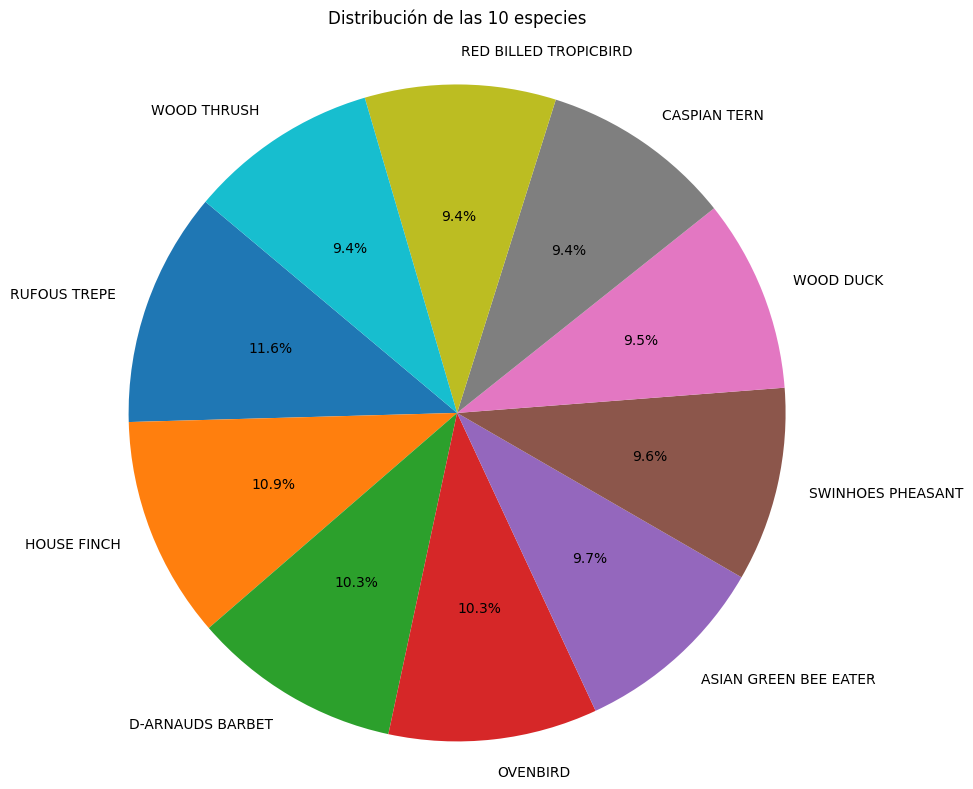

In [ ]:
# Crear la figura
plt.figure(figsize=(10, 8))

# Graficar el pastel
plt.pie(count10['Cantidad'], labels=count10['Especie'],autopct='%1.1f%%', startangle=140)

# Añadir título y ajustar la separación
plt.title('Distribución de las 10 especies', pad=20)

# Mostrar la gráfica
plt.axis('equal')  # Para asegurar que la gráfica sea un círculo
plt.tight_layout()
plt.show()

# Eliminamos la variable count10 por cuestiones de memoria
del count10

#Vectorizando las imagenes y agregandolas al dataset


In [3]:
dt = pd.read_csv("birds_update_codified.csv")

dt.head()

,Direccion imagen,Especie,Tipo dato,Nombre cientifico,Especie_codificada
0,train/ASIAN GREEN BEE EATER/162.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0
1,train/ASIAN GREEN BEE EATER/136.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0
2,train/ASIAN GREEN BEE EATER/153.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0
3,train/ASIAN GREEN BEE EATER/102.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0
4,train/ASIAN GREEN BEE EATER/145.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0


##Creando el nombres de las columnas

In [4]:
nombres_gray = []
nombres_rgb = []

for fila in range(224):
  for columna in range(224):

    cadena = "(" +str(fila)+","+str(columna) + ")"
    nombres_gray.append(cadena)

    for rgb in range(3):

      cadena = "(" +str(fila)+","+str(columna) + "," + str(rgb)+")"
      nombres_rgb.append(cadena)

##Vectorizando imagenes

In [5]:
def barra_progreso(iteracion, total, value, longitud = 100):
  cargando = ['/', '-', '\\', '|']
  porcentaje = iteracion/total
  carga = int(porcentaje*longitud)
  no_cargado = longitud-carga
  cadena = '█'*carga + '-'*no_cargado
  sys.stdout.write(f"\r\033[30m{cadena} {int(porcentaje * 100)}% {cargando[iteracion%4]} - {value}\033[0m")
  sys.stdout.flush()






grays = np.zeros((len(dt), 224*224)).astype(np.uint8)
rgbs = np.zeros((len(dt), 224*224*3)).astype(np.uint8)

iteracion = 1
for direccion_archivo in dt['Direccion imagen']:
  try:

    imagenRGB = cv2.cvtColor(cv2.imread(direccion_archivo), cv2.COLOR_BGR2RGB)
    imagenGRAY = cv2.cvtColor(imagenRGB, cv2.COLOR_RGB2GRAY)

    grays[iteracion-1,:] = imagenGRAY.flatten()
    rgbs[iteracion-1,:] = imagenRGB.flatten()


    del imagenRGB
    del imagenGRAY
  except Exception as e:
    print("No se pudo obtener la imagen:",e)
  finally:
    val = "Imagen: " + direccion_archivo
    barra_progreso(iteracion, dt.shape[0], val, longitud = 50)
    iteracion += 1

██████████████████████████████████████████████████ 100% | - Imagen: valid/WOOD THRUSH/2.jpg

##Añadiendo imagenes vectorizadas al dataset

In [6]:
dt_gray = dt.copy()
dt_rgb = dt.copy()

images = pd.DataFrame(grays, columns=nombres_gray)
dt_gray = pd.concat([dt_gray, images], axis=1)

del grays

display(dt_gray.head())

images = pd.DataFrame(rgbs, columns=nombres_rgb)
dt_rgb = pd.concat([dt_rgb, images], axis=1)

del rgbs
del images

display(dt_rgb.head())

,Direccion imagen,Especie,Tipo dato,Nombre cientifico,Especie_codificada,"(0,0)","(0,1)","(0,2)","(0,3)","(0,4)",...,"(223,214)","(223,215)","(223,216)","(223,217)","(223,218)","(223,219)","(223,220)","(223,221)","(223,222)","(223,223)"
0,train/ASIAN GREEN BEE EATER/162.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,49,49,50,50,51,...,19,20,18,19,19,20,21,21,22,22
1,train/ASIAN GREEN BEE EATER/136.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,120,123,123,124,124,...,114,119,114,117,118,113,113,108,111,111
2,train/ASIAN GREEN BEE EATER/153.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,144,144,144,144,144,...,160,160,160,160,160,160,160,160,160,160
3,train/ASIAN GREEN BEE EATER/102.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,157,157,157,157,157,...,151,151,151,151,151,151,151,151,151,152
4,train/ASIAN GREEN BEE EATER/145.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,148,148,148,147,146,...,157,157,158,158,158,160,160,160,160,161


,Direccion imagen,Especie,Tipo dato,Nombre cientifico,Especie_codificada,"(0,0,0)","(0,0,1)","(0,0,2)","(0,1,0)","(0,1,1)",...,"(223,220,2)","(223,221,0)","(223,221,1)","(223,221,2)","(223,222,0)","(223,222,1)","(223,222,2)","(223,223,0)","(223,223,1)","(223,223,2)"
0,train/ASIAN GREEN BEE EATER/162.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,56,50,24,56,50,...,12,27,20,12,28,21,13,28,21,13
1,train/ASIAN GREEN BEE EATER/136.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,130,131,37,133,134,...,44,125,113,39,128,116,42,128,116,42
2,train/ASIAN GREEN BEE EATER/153.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,159,152,64,159,152,...,107,185,157,107,185,157,107,185,157,107
3,train/ASIAN GREEN BEE EATER/102.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,153,159,159,153,159,...,153,148,152,153,148,152,153,149,153,154
4,train/ASIAN GREEN BEE EATER/145.jpg,ASIAN GREEN BEE EATER,train,MEROPS ORIENTALIS,0,120,179,63,120,179,...,155,160,161,155,160,161,155,161,162,156


# Entrenamiento con diferentes modelos de machine learning

## Separando entranamiento y testeo (70-30)

In [7]:
x_gray = dt_gray.iloc[:,5:]
y_gray = dt_gray.iloc[:,4]

x_rgb = dt_rgb.iloc[:,5:]
y_rgb = dt_rgb.iloc[:,4]

x_train_gray, x_test_gray, y_train_gray, y_test_gray = train_test_split(x_gray, y_gray, test_size=0.3, random_state=7)
x_train_rgb, x_test_rgb, y_train_rgb, y_test_rgb = train_test_split(x_rgb, y_rgb, test_size=0.3, random_state=7)

## Aplicando Naive Gaussian Bayes

### Sin paramentros:
- Accuracy gray: 0.281
- Tiempo: 2.26 segundos
- Accuracy rgb: 0.362
- Tiempo: 8.223 segundos

In [15]:
gnb_gray = GaussianNB()
gnb_rgb = GaussianNB()

start_time = time.time()
gnb_gray.fit(x_train_gray,y_train_gray)
end_time = time.time()
tiempo= round(end_time-start_time,3)

print("- Accuracy gray: %.3f"%accuracy_score(gnb_gray.predict(x_test_gray), y_test_gray))
print("- Tiempo:",tiempo,"segundos")

start_time = time.time()
gnb_rgb.fit(x_train_rgb,y_train_rgb)
end_time = time.time()
tiempo= round(end_time-start_time,3)

print("- Accuracy rgb: %.3f"%accuracy_score(gnb_rgb.predict(x_test_rgb), y_test_rgb))
print("- Tiempo:",tiempo,"segundos")

- Accuracy gray: 0.281
- Tiempo: 2.26 segundos
- Accuracy rgb: 0.362
- Tiempo: 8.223 segundos


#Aplicando Decision Tree classifier

### Sin parametros:
- Accuracy gray: 0.256
- Tiempo: 110.83 segundos
- Accuracy rgb: 0.273
- Tiempo: 307.579 segundos

In [ ]:
dtc_gray = DecisionTreeClassifier()
dtc_rgb = DecisionTreeClassifier()

start_time = time.time()
dtc_gray.fit(x_train_gray,y_train_gray)
end_time = time.time()
tiempo= round(end_time-start_time,3)

print("- Accuracy gray: %.3f"%accuracy_score(dtc_gray.predict(x_test_gray), y_test_gray))
print("- Tiempo:",tiempo,"segundos")


start_time = time.time()
dtc_rgb.fit(x_train_rgb,y_train_rgb)
end_time = time.time()
tiempo= round(end_time-start_time,3)

print("- Accuracy rgb: %.3f"%accuracy_score(dtc_rgb.predict(x_test_rgb), y_test_rgb))
print("- Tiempo:",tiempo,"segundos")

## Aplicando Random Forest classifier

### parametros: max_depth=30, n_estimators=500
- Accuracy gray: 0.444
- Tiempo: 164.49 segundos
- Accuracy rgb: 0.523
- Tiempo: 245.134 segundos

In [10]:
rfc_gray = RandomForestClassifier(max_depth=30, n_estimators=500)
rfc_rgb = RandomForestClassifier(max_depth=30, n_estimators=500)

start_time = time.time()
rfc_gray.fit(x_train_gray,y_train_gray)
end_time = time.time()
tiempo= round(end_time-start_time,3)

print("- Accuracy gray: %.3f"%accuracy_score(rfc_gray.predict(x_test_gray), y_test_gray))
print("- Tiempo:",tiempo,"segundos")


start_time = time.time()
rfc_rgb.fit(x_train_rgb,y_train_rgb)
end_time = time.time()
tiempo= round(end_time-start_time,3)

print("- Accuracy rgb: %.3f"%accuracy_score(rfc_rgb.predict(x_test_rgb), y_test_rgb))
print("- Tiempo:",tiempo,"segundos")

- Accuracy gray: 0.436
- Tiempo: 165.665 segundos
- Accuracy rgb: 0.557
- Tiempo: 271.764 segundos


## Aplicando Support vector machine

### Sin paramtros:
- Accuracy gray: 0.438
- Tiempo: 238.128 segundos
- Accuracy rgb: 0.543
- Tiempo: 846.6 segundos

In [12]:
svmc_gray = SVC()
svmc_rgb = SVC()

start_time = time.time()
svmc_gray.fit(x_train_gray,y_train_gray)
end_time = time.time()
tiempo= round(end_time-start_time,3)

print("- Accuracy gray: %.3f"%accuracy_score(svmc_gray.predict(x_test_gray), y_test_gray))
print("- Tiempo:",tiempo,"segundos")


start_time = time.time()
svmc_rgb.fit(x_train_rgb,y_train_rgb)
end_time = time.time()
tiempo= round(end_time-start_time,3)

print("- Accuracy rgb: %.3f"%accuracy_score(svmc_rgb.predict(x_test_rgb), y_test_rgb))
print("- Tiempo:",tiempo,"segundos")

- Accuracy gray: 0.438
- Tiempo: 238.128 segundos
- Accuracy rgb: 0.543
- Tiempo: 846.6 segundos
